**This notebook is my answer to the Housing Price Competition that is being held in https://www.kaggle.com/competitions/home-data-for-ml-course/overview. In this competition we were asked to predict the sale price of houses given over 70 variables. For a training dataset with the mean of the target feature ('SalePrice') of around 180000, my model managed to predict with mean absolute error of around 15000.**

---


# Setup

1. Please add the train.csv and test.csv by clicking the +Add Data button on the right side
2. Run the following cell to set up the feedback system.

In [1]:
# Set up code checking

import os
if not os.path.exists("../input/train.csv"):
    os.symlink("../input/home-data-for-ml-course/train.csv", "../input/train.csv")  
    os.symlink("../input/home-data-for-ml-course/test.csv", "../input/test.csv")  
from learntools.core import binder
binder.bind(globals())
from learntools.ml_intermediate.ex1 import *
print("Setup Complete")

Setup Complete


In [2]:
# import data and turn it into a pandas DataFrame

import pandas as pd

data= pd.read_csv('../input/train.csv', index_col='Id')
data_test= pd.read_csv('../input/test.csv', index_col='Id')
print(data.info())
print(data_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuilt    

In [3]:
# Importing libraries needed for data processing, namely SimpleImputer and OH Encoder

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder

# Dropping features with lots of NaN values
def clean_data(data):
    data = data.drop(["MiscFeature", "Fence", "PoolQC", "Alley", "FireplaceQu"], axis=1)
    return data
    
data = clean_data(data)
data_test = clean_data(data_test)

# Create a copy of data called X for the features and y for the target
X = data.copy()
y = X.pop("SalePrice")

# Divide X into X categorical and X numerical as both will undergo different processing
categorical_cols = [cname for cname in X.columns if X[cname].dtype == "object"]+['MSSubClass']
numerical_cols = [cname for cname in X.columns if X[cname].dtype in ['int64', 'float64'] and cname != 'MSSubClass']
Xcat=X[categorical_cols]
Xnum=X[numerical_cols]

#Create Imputer and OH Encoder objects
imputer1=SimpleImputer(strategy='median')
imputer2=SimpleImputer(strategy='most_frequent')
OH_encoder = OneHotEncoder(handle_unknown='ignore',sparse_output=False)

#Process Xcat and Xnum using imputer objects
imputed_Xnum = pd.DataFrame(imputer1.fit_transform(Xnum))
imputed_Xcat = pd.DataFrame(imputer2.fit_transform(Xcat))
imputed_Xnum.columns = Xnum.columns
imputed_Xcat.columns = Xcat.columns
imputed_Xnum.index = Xnum.index
imputed_Xcat.index = Xcat.index

#Process Xcat using OH encoder object to convert it to numerical value
imputed_Xcat = pd.DataFrame(OH_encoder.fit_transform(imputed_Xcat[categorical_cols]), columns=OH_encoder.get_feature_names_out(input_features=categorical_cols), index=imputed_Xcat.index)
imputed_Xcat[imputed_Xcat.columns]=imputed_Xcat[imputed_Xcat.columns].astype(int)

#Concat the imputed Xcat and Xnum together
Xnew=pd.concat([imputed_Xcat,imputed_Xnum],axis=1)

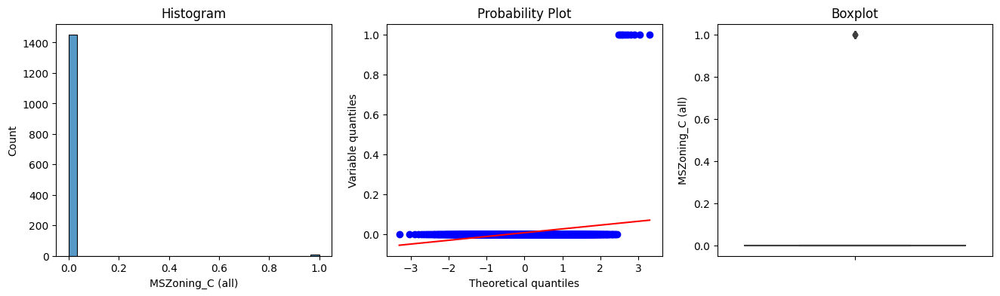

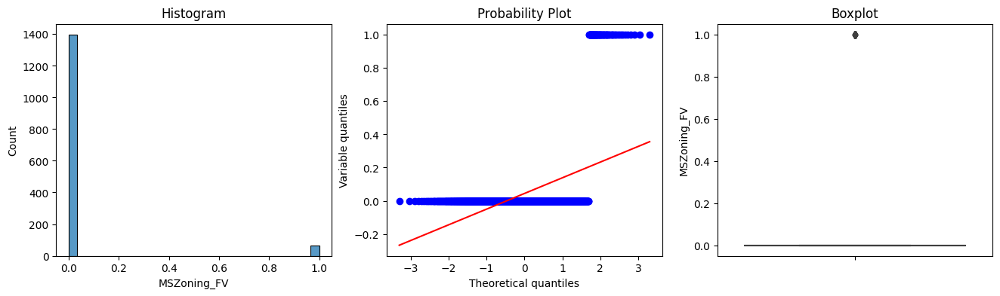

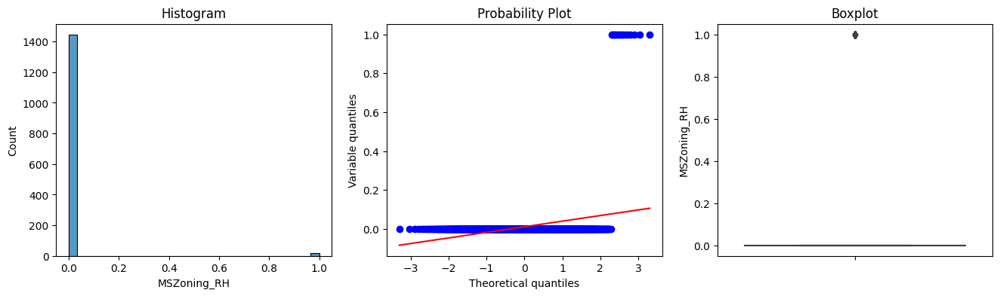

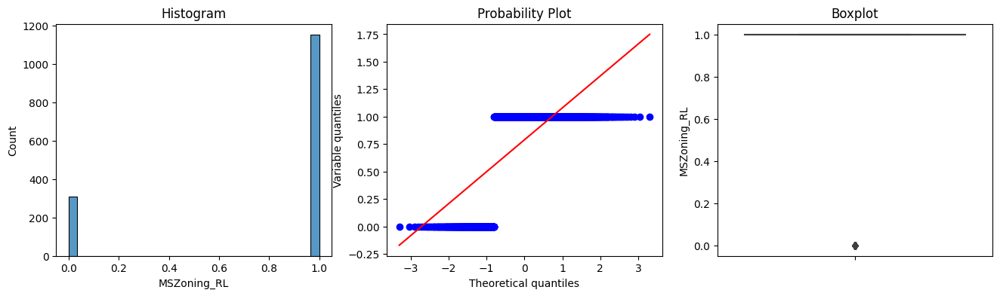

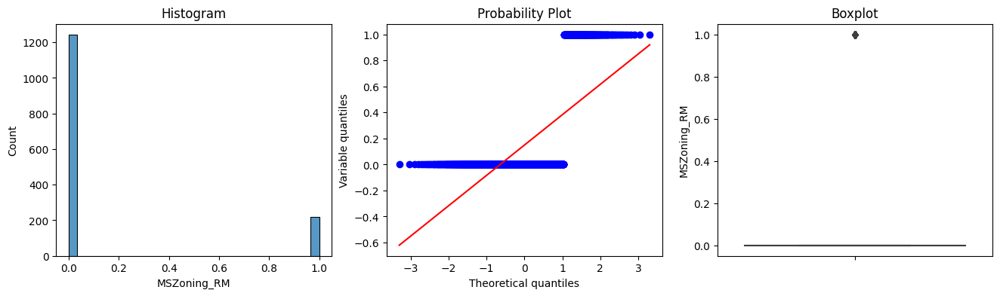

...

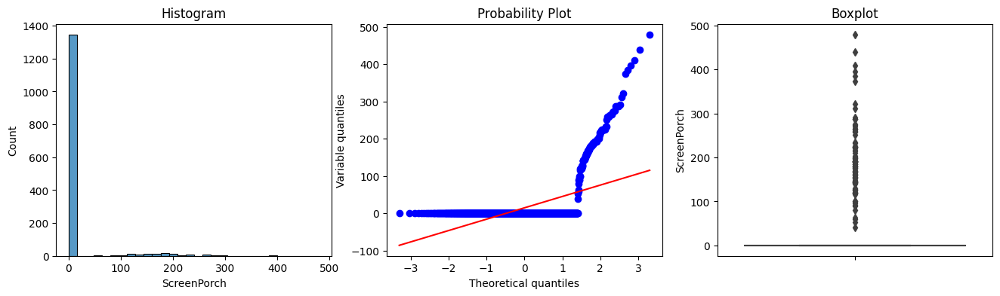

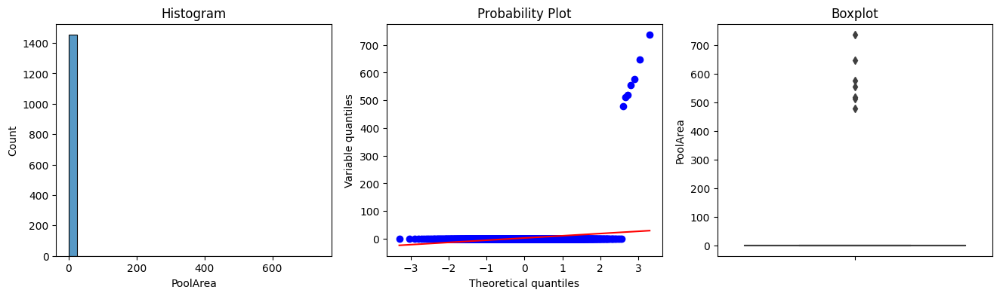

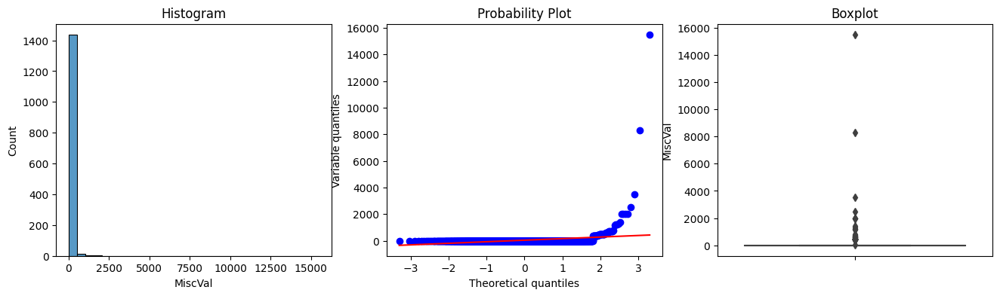

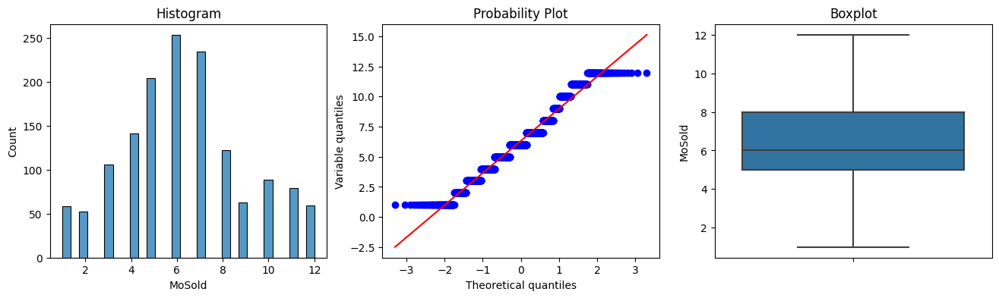

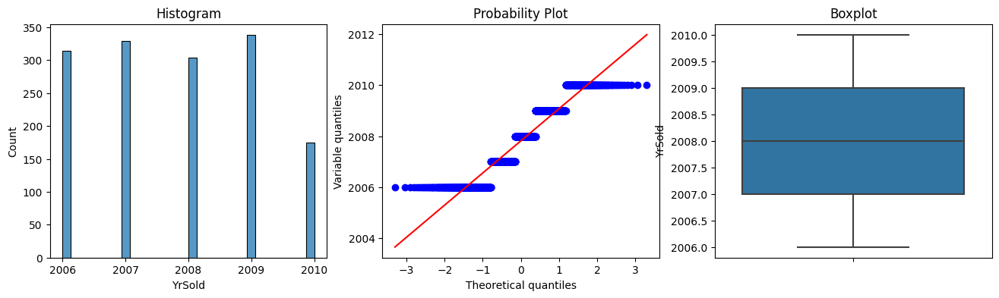

In [4]:
#import all the libraries needed to visualize the processed data and view its skewness
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

#define function to plot all the variables
def check_plot(df, variable):
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q 
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

#plot the variables
for i in Xnew.columns:
    check_plot(Xnew, i)


In [5]:
#You will find out that the data were skewed. Therefore use the MinMaxScaler

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
xnewscaled=scaler.fit_transform(Xnew)
xnewscaled=pd.DataFrame(xnewscaled,columns=Xnew.columns,index=Xnew.index)

In [6]:
#Now that we have scaled, we need to filter out the most important features using MI
from sklearn.feature_selection import mutual_info_regression

#Define the MI function
def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

#MI function requires us to instruct which features are of discrete values
discrete_features = Xnew.dtypes == int

#Run the MI function and see the result
mi_scores = make_mi_scores(xnewscaled, y, discrete_features)
mi_scores

OverallQual            0.574688
GrLivArea              0.483376
GarageCars             0.376956
TotalBsmtSF            0.366457
GarageArea             0.362861
                         ...   
Condition1_RRNn        0.000000
Functional_Maj1        0.000000
Exterior1st_Stucco     0.000000
Exterior2nd_AsphShn    0.000000
BsmtExposure_Mn        0.000000
Name: MI Scores, Length: 283, dtype: float64

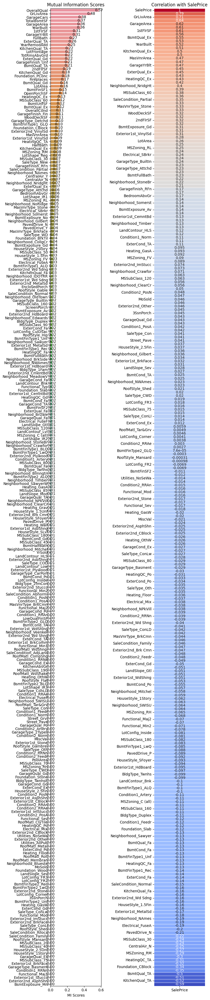

In [7]:
#Now is the time to visualize. We will use MI double checked with SNS corr for that purpose

# Create the MI scores plot (left)
plt.figure(figsize=(8, 38))
plt.subplot(1, 2, 1)  
ax=sns.barplot(x=mi_scores, y=mi_scores.index)
plt.title("Mutual Information Scores")
for index, value in enumerate(mi_scores):
    ax.text(value, index, f'{value:.2f}', ha='center', va='center', fontsize=10)

# Create the SNS corr plot (right)
xnewscaledy=pd.concat([xnewscaled,y],axis=1)
correlation_matrix = xnewscaledy.corr()
correlations_with_target = correlation_matrix['SalePrice'].sort_values(ascending=False)
plt.subplot(1, 2, 2) 
sns.heatmap(correlations_with_target.to_frame(), annot=True, cmap="coolwarm", linewidths=0.5, cbar=False)
plt.title('Correlation with SalePrice')

# Adjust spacing between plots
plt.tight_layout()

plt.show()

In [8]:
#we will use features with MI scores above 0.01, you can experiment with this number

cols_to_use = mi_scores[mi_scores > 0.01].index
xnewscaled2=xnewscaled[cols_to_use]
print(xnewscaled2)

      OverallQual  GrLivArea  GarageCars  TotalBsmtSF  GarageArea  YearBuilt  \
Id                                                                             
1        0.666667   0.259231        0.50     0.140098    0.386460   0.949275   
2        0.555556   0.174830        0.50     0.206547    0.324401   0.753623   
3        0.666667   0.273549        0.50     0.150573    0.428773   0.934783   
4        0.666667   0.260550        0.75     0.123732    0.452750   0.311594   
5        0.777778   0.351168        0.75     0.187398    0.589563   0.927536   
...           ...        ...         ...          ...         ...        ...   
1456     0.555556   0.247362        0.50     0.155974    0.324401   0.920290   
1457     0.555556   0.327619        0.50     0.252373    0.352609   0.768116   
1458     0.666667   0.377920        0.25     0.188543    0.177715   0.500000   
1459     0.444444   0.140166        0.25     0.176432    0.169252   0.565217   
1460     0.444444   0.173700        0.25

In [9]:
#We will create XGB model. Feel free to experiment with all the parameters

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor

X_train, X_valid, y_train, y_valid = train_test_split(xnewscaled2, y,train_size=0.7, test_size=0.3,
                                                      random_state=0)
my_model = XGBRegressor(n_estimators=200, learning_rate=0.05, early_stopping_rounds=5)
my_model.fit(X_train, y_train,  
             eval_set=[(X_valid, y_valid)], 
             verbose=False)
predictions = my_model.predict(X_valid)
print("Mean Absolute Error: " + str(mean_absolute_error(predictions, y_valid)))

Mean Absolute Error: 15535.982965896119


In [10]:
#We were done with making the model. Now all is left is process the test data and implement the model

#Create the copy of test data
Xtest=data_test.copy()
Xtestcat=Xtest[categorical_cols]
Xtestnum=Xtest[numerical_cols]

#Impute using the same imputer used in imputing train data
imputed_Xtestnum = pd.DataFrame(imputer1.transform(Xtestnum))
imputed_Xtestcat = pd.DataFrame(imputer2.transform(Xtestcat))
imputed_Xtestnum.columns = Xtestnum.columns
imputed_Xtestcat.columns = Xtestcat.columns
imputed_Xtestnum.index = Xtestnum.index
imputed_Xtestcat.index = Xtestcat.index

#Encode using the same encoder used in encoding train data
imputed_Xtestcat = pd.DataFrame(OH_encoder.transform(imputed_Xtestcat[categorical_cols]), columns=OH_encoder.get_feature_names_out(input_features=categorical_cols), index=imputed_Xtestcat.index)
imputed_Xtestcat[imputed_Xtestcat.columns]=imputed_Xtestcat[imputed_Xtestcat.columns].astype(int)
Xtestnew=pd.concat([imputed_Xtestcat,imputed_Xtestnum],axis=1)

#Scale using the same scaler used in scaling train data
xtestnewscaled=scaler.transform(Xtestnew)
xtestnewscaled=pd.DataFrame(xtestnewscaled,columns=Xtestnew.columns,index=Xtestnew.index)

#Use the same features being used in the train data
xtestnewscaled2=xtestnewscaled[cols_to_use]

# Generate test predictions
preds_test = my_model.predict(xtestnewscaled2)

# Save predictions in format used for competition scoring
output = pd.DataFrame({'Id': data_test.index,
                       'SalePrice': preds_test})
output.to_csv('submission11.csv', index=False)